In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))

In [2]:
import sys
sys.path.append("/export/raid1/home/styvesg/code/")

import nsd_gnet8x.src.numpy_utility as pnu
from nsd_gnet8x.src.file_utility import save_stuff, flatten_dict, embed_dict, zip_dict
from nsd_gnet8x.src.config import *

from src.utility import *
from src.sampler import *

%matplotlib inline

In [3]:
model_dir = "../nsd_gnet8x/output/multisubject/gnet8j64t192_mpf_general_Jan-25-2023_1316/"

input_dir = root_dir
output_dir = model_dir #root_dir + 'output/'

stim_dir = root_dir+'../../data/nsd/stims/'
voxel_dir = root_dir+'../../data/nsd/voxels/'

exp_design_file = root_dir+"../../data/nsd/nsd_expdesign.mat"

# Reload stim and labels
We are keeping the subjectwise image to the respective subject for direct comparision with data

In [4]:
subjects = [1, 2, 3, 4, 5, 6, 7, 8]

In [5]:
from nsd_gnet8x.src.load_nsd import image_feature_fn

stim_data = {}
for s in subjects: 
    image_data_set = h5py.File(stim_dir + "S%d_stimuli_227.h5py"%s, 'r')
    stim_data[s] = image_feature_fn(np.copy(image_data_set['stimuli']))
    image_data_set.close()
    print ('--------  subject %d  -------' % s)
    print ('block size:', stim_data[s].shape, ', dtype:', stim_data[s].dtype, ', value range:',\
           np.min(stim_data[s][0]), np.max(stim_data[s][0]))

--------  subject 1  -------
block size: (10000, 3, 227, 227) , dtype: float32 , value range: 0.0 1.0
--------  subject 2  -------
block size: (10000, 3, 227, 227) , dtype: float32 , value range: 0.0 1.0
--------  subject 3  -------
block size: (10000, 3, 227, 227) , dtype: float32 , value range: 0.0 1.0
--------  subject 4  -------
block size: (10000, 3, 227, 227) , dtype: float32 , value range: 0.0 1.0
--------  subject 5  -------
block size: (10000, 3, 227, 227) , dtype: float32 , value range: 0.0 1.0
--------  subject 6  -------
block size: (10000, 3, 227, 227) , dtype: float32 , value range: 0.0 1.0
--------  subject 7  -------
block size: (10000, 3, 227, 227) , dtype: float32 , value range: 0.0 1.0
--------  subject 8  -------
block size: (10000, 3, 227, 227) , dtype: float32 , value range: 0.0 1.0


In [6]:
cat_data = {}
for s in subjects: 
    cat_data_set = h5py.File(stim_dir + "S%d_supercategory_227.h5py"%s, 'r')
    cat_data[s] = embed_dict({s: np.copy(d) for s,d in cat_data_set.items()})
    cat_data_set.close()
    print ('--------  subject %d  -------' % s)
    print (cat_data[s].keys())
    #print ('block size:', stim_data[s].shape, ', dtype:', stim_data[s].dtype, ', value range:',\
    #       np.min(stim_data[s][0]), np.max(stim_data[s][0]))

--------  subject 1  -------
dict_keys(['label_count', 'label_map', 'labels'])
--------  subject 2  -------
dict_keys(['label_count', 'label_map', 'labels'])
--------  subject 3  -------
dict_keys(['label_count', 'label_map', 'labels'])
--------  subject 4  -------
dict_keys(['label_count', 'label_map', 'labels'])
--------  subject 5  -------
dict_keys(['label_count', 'label_map', 'labels'])
--------  subject 6  -------
dict_keys(['label_count', 'label_map', 'labels'])
--------  subject 7  -------
dict_keys(['label_count', 'label_map', 'labels'])
--------  subject 8  -------
dict_keys(['label_count', 'label_map', 'labels'])


## Things supercategory: outdoor food indoor appliance kitchen sports person animal vehicle accessory electronic furniture

In [7]:
thing_label_index = np.array([0,1,2,3,4,5,6,7,8,9,10,11])
thing_labelmap = {int(i): ('%s' % cat_data[1]['label_map']['%d'%i])[2:-1] for i in thing_label_index}

In [8]:
print (thing_labelmap)

{0: 'appliance', 1: 'accessory', 2: 'kitchen', 3: 'furniture', 4: 'indoor', 5: 'outdoor', 6: 'vehicle', 7: 'electronic', 8: 'sports', 9: 'food', 10: 'person', 11: 'animal'}


In [9]:
things_mh = {s: np.zeros(shape=(len(cat_data[s]['labels']), len(thing_label_index))) for s in subjects}
for s in subjects:
    for k,lim in enumerate(cat_data[s]['labels']):
        uni = np.unique(lim)
        uni_thing = intersection(uni, thing_label_index)
        things_mh[s][k, uni_thing] = 1 # this only works because the index are already a minimal set starting at zero

In [10]:
# there needs to be some filtering for incomplete samples
print ( things_mh[1].shape)

(10000, 12)


Minimum #samples = 686


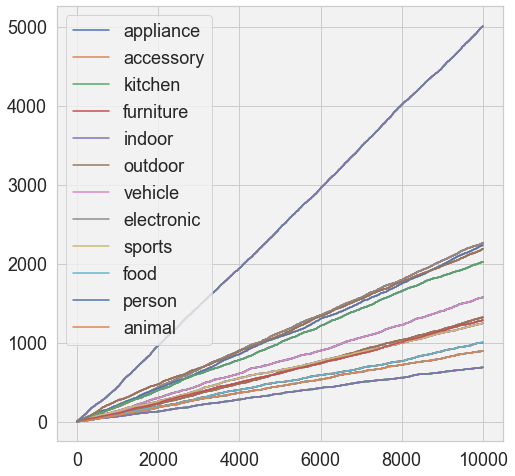

In [11]:
fig=plt.figure(figsize=(8,8))
ymin = np.inf
for s in subjects:
    for k in thing_label_index:
        y = np.cumsum(things_mh[1][:,k], axis=0)
        if y[-1]<ymin:
            ymin = y[-1]
        plt.plot(y, label=thing_labelmap[k] if s==1 else None)
plt.legend(loc='upper left')
print ('Minimum #samples = %d'%ymin)

In [12]:
filename = output_dir + "nsd_supercategory_count%s" % (saveext)
fig.savefig(filename, **savearg)
plt.close()

In [13]:
print ('geom set min #samples = ', int(min([np.min(np.sum(things_mh[s][:1000], axis=0)) for s in subjects])))
print ('geom set min #samples = ', int(min([np.min(np.sum(things_mh[s][1000:], axis=0)) for s in subjects])))

geom set min #samples =  65
geom set min #samples =  589


Main label:  appliance


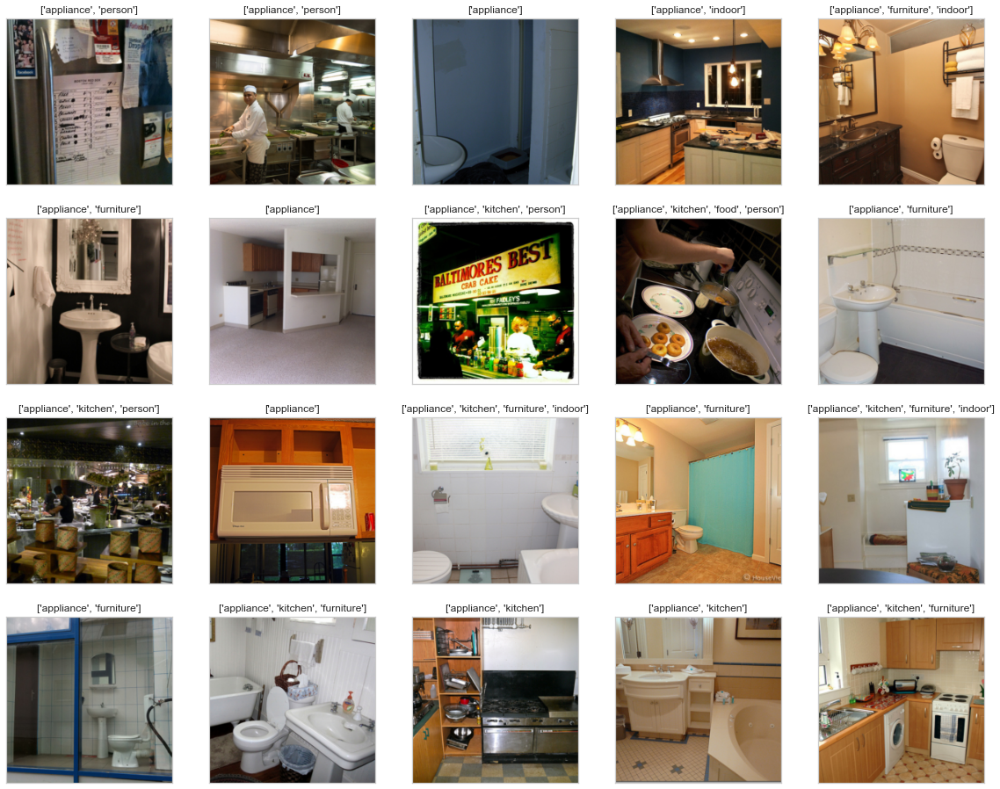

In [14]:
subj = 6
a_thing = 0
n_start = 0
n_img = 20
n_row = 4
print ('Main label: ', thing_labelmap[a_thing])
thing_sample_indices = get_n_random_thing_samples(things_mh, subj, a_thing, 100)
plt.figure(figsize=(4*int(np.ceil(float(n_img)/n_row)), 4*n_row))
for k,i in enumerate(range(n_start, n_start+n_img)):
    j = thing_sample_indices[i]
    
    plt.subplot(n_row, int(np.ceil(float(n_img)/n_row)), k+1)
    plt.imshow(stim_data[subj][j].transpose(1,2,0))
    plt.grid(False)
    plt.gca().set_xticklabels([])
    plt.gca().set_yticklabels([])
    
    im_label = thing_label_index[things_mh[subj][j].astype(bool)]
    plt.title([thing_labelmap[lab] for lab in im_label], fontsize=12)

In [15]:
from src.plots import highlight_mask, other_mask, apply_highlight, apply_mask

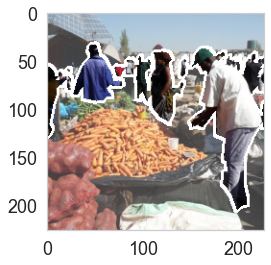

In [16]:
hl = highlight_mask(cat_data[1]['labels'][0], 10, lw=3)
im = apply_highlight(stim_data[1][0].transpose(1,2,0), hl)
im = apply_mask(im, other_mask(cat_data[1]['labels'][0], 10), alpha=.25)

plt.figure(figsize=(4, 4))
plt.imshow(im)
plt.grid(False)

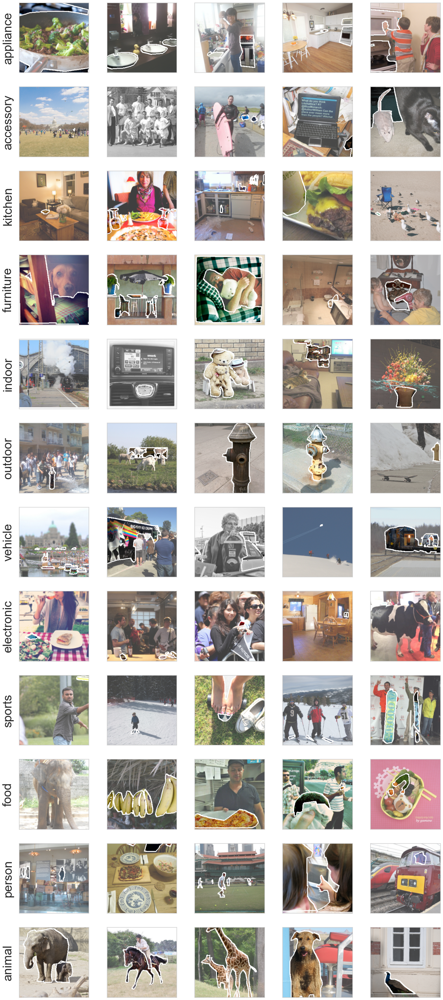

In [17]:
subj = 1
n_start = 0
n_img = 5

K = things_mh[1].shape[1]
fig=plt.figure(figsize=(4*n_img,  4*K))
for l in range(K):
    thing_sample_indices = get_n_random_thing_samples(things_mh, subj, l, 100)
    for k,i in enumerate(range(n_start, n_start+n_img)):
        j = thing_sample_indices[i]

        hl = highlight_mask(cat_data[subj]['labels'][j], l, lw=3)
        im = apply_highlight(stim_data[subj][j].transpose(1,2,0), hl)
        im = apply_mask(im, other_mask(cat_data[1]['labels'][j], l), alpha=.25)

        plt.subplot(K, n_img, l*n_img+k+1)
        plt.imshow(im) #stim_data[subj][j].transpose(1,2,0))
        plt.grid(False)
        plt.gca().set_xticklabels([])
        plt.gca().set_yticklabels([])

        im_label = thing_label_index[things_mh[subj][j].astype(bool)]
        #plt.title([thing_labelmap[lab] for lab in im_label], fontsize=12)
        if k==0:
            plt.ylabel(thing_labelmap[l], fontsize=32)

In [28]:
filename = output_dir + "nsd_supercategory_examples_highlighted%s" % (saveext)
fig.savefig(filename, **savearg)
plt.close()

In [16]:
print (output_dir)

../nsd_gnet8x/output/multisubject/gnet8j64t192_mpf_general_Jan-25-2023_1316/


# Reload nsd predictions and masks

In [18]:
data_set = h5py.File(model_dir + 'nsd_prediction_all.h5py', 'r')
#data_set = h5py.File(model_dir + 'nsd_stim_pred_all.h5py', 'r')
nsd_stim_pred_dict = embed_dict({s: np.copy(d) for s,d in data_set.items()})
data_set.close()
print (nsd_stim_pred_dict.keys())

dict_keys(['brain_nii_shape', 'pred', 'val_cc', 'voxel_index', 'voxel_mask', 'voxel_roi'])


In [19]:
#print (nsd_stim_pred_dict['subjects'])
print (nsd_stim_pred_dict['pred'].keys())

dict_keys(['1', '2', '3', '4', '5', '6', '7', '8'])


In [20]:
print (nsd_stim_pred_dict['pred']['1'].shape)

(10000, 11838)


## Voxel masks

In [21]:
from nsd_gnet8x.src.file_utility import load_mask_from_nii, view_data
from nsd_gnet8x.src.roi import roi_map, iterate_roi
from matplotlib import cm

#voxel_strm_roi
stream_names = ['early', 'midventral', 'midlateral', 'midparietal', 'ventral', 'lateral', 'parietal']
stream_group = [[1], [2], [3], [4], [5], [6], [7]]

group_names = ['V1', 'V2', 'V3', 'hV4', 'V3ab', 'LO', 'IPS', 'VO', 'PHC', 'MT', 'MST', 'other']
group = [[1,2],[3,4],[5,6], [7], [16, 17], [14, 15], [18,19,20,21,22,23], [8, 9], [10,11], [13], [12], [24,25,0]]

plot_roi = ['V1', 'V2', 'V3', 'hV4', 'MST', 'V3ab', 'MT', 'PHC', 'VO', 'LO', 'IPS']
roi_cmap = {roi: cm.get_cmap('rainbow', len(plot_roi))(k) for k,roi in enumerate(plot_roi)}
subj_cmap = {s: cm.get_cmap('rainbow', 9)(k+1) for k,s in enumerate(subjects)}

# z-scoring

In [22]:
for s in subjects:
    nsd_stim_pred_dict['pred']['%s'%s] -= np.mean(nsd_stim_pred_dict['pred']['%s'%s], axis=0, keepdims=True)
    nsd_stim_pred_dict['pred']['%s'%s] /= np.std(nsd_stim_pred_dict['pred']['%s'%s], axis=0, keepdims=True)

In [23]:
print ('geom set min #samples = ', int(min([np.min(np.sum(things_mh[s][:1000], axis=0)) for s in subjects])))
print ('geom set min #samples = ', int(min([np.min(np.sum(things_mh[s][1000:], axis=0)) for s in subjects])))

geom set min #samples =  65
geom set min #samples =  589


# Split data set into multiple (ROI-wise) feature spaces

In [24]:
feature_dicts = {} # dict[#subject][#ROI]
for s in subjects:
    feature_dicts[s] = {}
    for roi_mask, roi_name in iterate_roi(group, nsd_stim_pred_dict['voxel_roi']['%s'%s], roi_map, group_names):
        feature_dicts[s][roi_name] = nsd_stim_pred_dict['pred']['%s'%s][:, roi_mask]

# Calculate concept SNR
## Project into 300 dimensions

In [25]:
feature_embs = {}
for s,dd in feature_dicts.items():
    sampler = Subsampler(random_projections=300, orthogonalize=False)
    feature_embs[s] = sampler.apply(dd)

## Calculate manifolds directions and SNR

In [26]:
from src.geometry import calculate_manifolds_directions, calculate_manifolds_SNR

manifold_dirs = calculate_manifolds_directions(feature_embs, labels=things_mh, P=580)
manifold_SNR = calculate_manifolds_SNR(manifold_dirs, m=5)

100%|██████████| 12/12 [00:00<00:00, 31.42it/s]


100%|██████████| 12/12 [00:00<00:00, 38.19it/s]


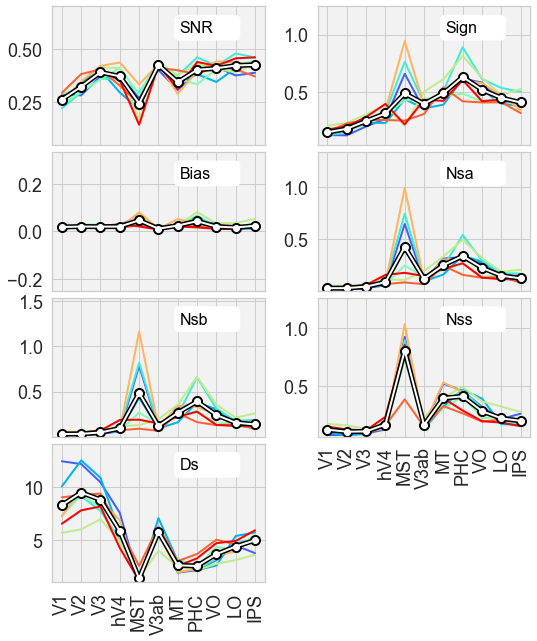

In [28]:
from src.plots import plot_SNR_summary

fig = plt.figure(figsize=(8, 10))
plt.subplots_adjust(left=0.15, bottom=0.15, right=.98, top=.95, wspace=0.25, hspace=0.05)
plot_SNR_summary(manifold_SNR, subj_cmap, plot_roi, perc_cutoff=25, fs=16)

In [83]:
filename = output_dir + "nsdpred_manifold_geometry_all_summary_rc%s" % (saveext)
fig.savefig(filename, **savearg)
plt.close()

# Convergence of geometry estimate as a function of subsampling dimension for each ROI
 For each ROI, plot the 2D array of SNR for a range of subsampling and random projection dimension

In [85]:
n_samples = 16
subspace_dims   = [50, 100, 500, 1000, 2000]
projection_dims = [25, 50, 100, 200, 300] 

S_average = {s: {r: np.zeros(shape=(len(subspace_dims), len(projection_dims))) for r in feature_dicts[s].keys()} for s in feature_dicts.keys()}
D_average = {s: {r: np.zeros(shape=(len(subspace_dims), len(projection_dims))) for r in feature_dicts[s].keys()} for s in feature_dicts.keys()}
SNR_average = {s: {r: np.zeros(shape=(len(subspace_dims), len(projection_dims))) for r in feature_dicts[s].keys()} for s in feature_dicts.keys()}
S_average_2 = {s: {r: np.zeros(shape=(len(subspace_dims), len(projection_dims))) for r in feature_dicts[s].keys()} for s in feature_dicts.keys()}
D_average_2 = {s: {r: np.zeros(shape=(len(subspace_dims), len(projection_dims))) for r in feature_dicts[s].keys()} for s in feature_dicts.keys()}
SNR_average_2 = {s: {r: np.zeros(shape=(len(subspace_dims), len(projection_dims))) for r in feature_dicts[s].keys()} for s in feature_dicts.keys()}

for i,sd in enumerate(subspace_dims):
    for j,pd in enumerate(projection_dims):
        for _ in range(n_samples):    
            feature_embs = {}
            for s,dd in feature_dicts.items():
                sampler = Subsampler(random_subspace=sd, random_projections=pd)
                feature_embs[s] = sampler.apply(dd)

            manifold_SNR = calculate_manifolds_SNR(calculate_manifolds_directions(feature_embs, labels=things_mh, P=580), m=5)    
            for s in SNR_average.keys():
                for r in SNR_average[s].keys():
                    S_average[s][r][i,j] += np.mean(nanfunc(manifold_SNR[s]['Sign'][r])) / n_samples
                    D_average[s][r][i,j] += np.mean(nanfunc(manifold_SNR[s]['Ds'][r])) / n_samples
                    SNR_average[s][r][i,j] += np.mean(nanfunc(manifold_SNR[s]['SNR'][r])) / n_samples
                    
                    S_average_2[s][r][i,j] += np.mean(nanfunc(manifold_SNR[s]['Sign'][r]))**2 / n_samples
                    D_average_2[s][r][i,j] += np.mean(nanfunc(manifold_SNR[s]['Ds'][r]))**2 / n_samples
                    SNR_average_2[s][r][i,j] += np.mean(nanfunc(manifold_SNR[s]['SNR'][r]))**2 / n_samples

 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 139.72it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 146.06it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 180.03it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 320.26it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 155.46it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 358.30it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 153.94it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1194.93it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 140.48it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 145.30it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 144.58it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 143.95it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 133.46it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 305.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 282.38it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1408.11it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 136.04it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 140.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 143.02it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 142.20it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 299.50it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 381.29it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 302.28it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1387.85it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 266.82it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 285.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 162.88it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 136.58it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 265.07it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 259.32it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 306.08it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1057.83it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 140.21it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 345.55it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 384.21it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 293.30it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 228.07it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 369.08it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 302.40it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1365.37it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 144.10it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 174.12it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 144.42it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 307.25it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 332.79it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 386.28it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 326.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1343.90it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 139.56it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 133.64it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.55it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 138.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 137.92it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 140.79it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 386.87it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1373.34it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 137.37it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 140.29it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 152.75it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 166.35it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 253.65it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 306.66it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 181.86it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1347.78it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 186.69it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 166.70it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 284.48it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 263.15it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 344.01it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 380.14it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 175.13it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1374.88it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 142.84it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 140.77it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.91it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.96it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 251.25it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 338.70it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.95it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1408.00it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 143.93it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.95it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 140.10it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 140.98it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 143.19it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 397.45it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1353.44it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 139.44it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 142.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 143.62it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 285.74it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 147.48it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 143.52it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 150.22it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1366.85it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 139.29it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.75it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 192.37it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 383.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 309.15it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 144.55it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 341.48it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1379.36it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 144.48it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 143.74it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 139.12it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 144.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 154.95it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 144.53it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 297.16it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1178.12it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.58it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 285.70it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 154.71it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 340.13it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 258.99it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 148.51it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 392.54it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1401.33it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 142.32it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 273.18it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 164.31it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 218.51it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 348.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 291.89it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 132.59it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1378.84it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 143.77it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 115.07it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 135.23it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 151.16it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 157.98it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 138.01it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 163.17it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1169.71it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 89.16it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 128.85it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 90.17it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 80.72it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 162.24it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 159.22it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 161.01it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1135.28it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 87.55it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 87.31it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 158.10it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 104.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 147.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 86.94it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 159.69it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1105.19it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 90.21it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 87.76it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 158.92it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 95.61it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 155.61it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 159.95it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 135.55it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1172.14it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 79.11it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 81.36it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 152.54it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 82.13it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 79.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 88.50it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 117.24it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1158.78it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 75.98it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 75.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 73.54it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 85.15it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 79.43it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 86.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 111.26it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1132.45it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 83.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 125.49it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 158.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 156.75it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 127.71it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 159.22it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 79.42it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1114.37it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 77.34it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 81.49it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 160.90it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 159.53it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 79.39it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 133.54it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 152.42it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1126.01it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 77.52it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 85.63it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 114.73it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 163.08it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 160.20it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 128.86it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 163.34it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1112.50it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 96.15it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 83.80it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 136.63it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 104.53it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 153.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 165.46it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 166.36it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1161.00it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 80.94it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 81.54it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 130.75it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 90.05it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 121.20it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 120.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 125.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1170.18it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 77.64it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 127.84it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 158.71it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 134.83it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 163.45it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 164.65it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 162.43it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1137.41it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 81.33it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 131.26it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 122.38it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 78.96it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 76.89it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 153.40it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 125.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1147.55it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 116.90it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 120.95it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 134.35it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 155.14it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 125.85it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 123.51it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 132.31it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1137.05it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 98.82it/s] 


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 118.49it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 90.13it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 106.40it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 97.35it/s] 


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 91.78it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 122.77it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1089.01it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 79.51it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 101.53it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 81.11it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 122.50it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 126.73it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 164.65it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 160.98it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1161.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.82it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 55.63it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 66.82it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 68.12it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 68.94it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 68.64it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 64.30it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 291.24it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 67.45it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 68.07it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 69.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 67.36it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 67.96it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 68.89it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.99it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 295.86it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 69.05it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 64.55it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 63.50it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 64.53it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 66.26it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 68.06it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 67.12it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 276.90it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 67.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 66.83it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 67.24it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 65.15it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.32it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 69.05it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 67.96it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 289.91it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 67.62it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 66.78it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 65.91it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 63.55it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 66.94it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 65.21it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 65.99it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 287.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 68.09it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.85it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 67.86it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 69.46it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 67.51it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 69.16it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.13it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 296.57it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 67.54it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.15it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 57.84it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 67.65it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 68.57it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 68.62it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 66.45it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 296.68it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 66.66it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 65.83it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 68.79it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 65.89it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 64.90it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.10it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 67.00it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 299.93it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 66.24it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 66.08it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 65.86it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 65.28it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 67.85it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 67.66it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 68.00it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 290.46it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.62it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 65.49it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.37it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 69.16it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 68.04it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 68.56it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 63.70it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 252.87it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 68.96it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 69.36it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 69.00it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 68.77it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 68.05it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 65.03it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 64.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 279.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 66.03it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.47it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 68.36it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 68.30it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 67.45it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 68.08it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 67.15it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 275.35it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 66.61it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 66.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 66.52it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 67.76it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 68.29it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 66.26it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 68.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 236.74it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 66.09it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 65.93it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 67.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 64.31it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 65.92it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 65.09it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 64.42it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 253.32it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 68.34it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 67.75it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 66.79it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 67.65it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 64.08it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 65.02it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 57.63it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 287.28it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 65.36it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 66.24it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 67.17it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.29it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 66.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 65.61it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 67.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 267.23it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.24it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.57it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.38it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 19.91it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.73it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.83it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.46it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 138.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.39it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.54it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.38it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.51it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.59it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.73it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.71it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 142.04it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.48it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.63it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.73it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.23it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.07it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.15it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 133.82it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.05it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.83it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.00it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.56it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 17.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.04it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.76it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.87it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.11it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 17.23it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.46it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.89it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 17.46it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 137.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.06it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.91it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 17.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.64it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 17.55it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.69it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 143.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 17.45it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.37it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.24it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.03it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.40it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.30it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.59it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 143.29it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.88it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.91it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.80it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.78it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.03it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.78it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 129.91it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.82it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.70it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.96it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.47it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.37it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.19it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.44it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 113.07it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 17.33it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.58it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.83it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.87it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.76it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.02it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.12it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 46.29it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.05it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.45it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.66it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.68it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 17.04it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.52it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.45it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 134.45it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.84it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.94it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.16it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.38it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.18it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.56it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 139.89it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.74it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.91it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.09it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.99it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.10it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.35it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 105.77it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.44it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.11it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.66it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.94it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.13it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.53it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.96it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 40.24it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.46it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.69it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.07it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.31it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.17it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.65it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.21it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 135.80it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.11it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.99it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.17it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.56it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.16it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.50it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.80it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 94.23it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.14it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.90it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.17it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.01it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.35it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 32.01it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.53it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.54it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.21it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.96it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.92it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.82it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.16it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.11it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.16it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.22it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.95it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.91it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.89it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.85it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 72.86it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.04it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.92it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.42it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.00it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.70it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.87it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.10it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 28.63it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.91it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.02it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.39it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.93it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.50it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.05it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 76.90it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.75it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.06it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.92it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.00it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.09it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.28it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.79it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 77.89it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.87it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.16it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.19it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.93it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.10it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.02it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 78.06it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.96it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.90it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.82it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.12it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.41it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.04it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.93it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 68.89it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.70it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.09it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.50it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.21it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.01it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.09it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 44.24it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.84it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.14it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.18it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.06it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.75it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.94it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.20it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 24.78it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.68it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.63it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.51it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.11it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.91it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.98it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.19it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 75.36it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.54it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.36it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.93it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.18it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.00it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.07it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.90it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.95it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.06it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.24it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.52it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.04it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.00it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.73it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 25.02it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.04it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.05it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.93it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.03it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.71it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.98it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.90it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 58.70it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.49it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.95it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.10it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.96it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.75it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 54.92it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.47it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.11it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.26it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.95it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.20it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.96it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.94it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 77.91it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 149.19it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 381.25it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 391.11it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 386.47it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 385.98it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 379.71it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 267.63it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1356.32it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 273.05it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 250.46it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 160.90it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 230.65it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.70it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 142.34it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 258.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1333.75it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 191.10it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 314.64it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 398.85it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 381.61it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 140.91it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 388.69it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.23it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1366.71it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 162.62it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 353.73it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 163.18it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 158.84it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 149.66it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 337.05it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 199.31it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1393.77it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.44it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 153.29it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 244.07it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 285.69it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 306.78it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.40it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 291.38it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1372.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 140.10it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 140.02it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 142.86it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 291.99it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 144.12it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 301.86it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 300.64it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1398.84it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 128.07it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 142.41it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 309.25it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 346.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 142.31it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 283.12it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 143.91it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1217.12it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 139.77it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.36it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 148.55it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 136.83it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 268.17it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 389.09it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1411.35it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 140.93it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.53it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 146.10it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 145.55it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 140.83it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 143.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 243.06it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1377.21it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 138.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 146.52it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 143.39it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.50it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 144.15it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 176.87it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 244.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1413.33it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 147.02it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.72it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 143.43it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 160.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 395.32it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 385.58it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 142.85it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1395.93it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 138.88it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.36it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.96it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 142.66it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.38it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 137.70it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 220.83it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1339.18it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 139.23it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 131.39it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 142.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 242.86it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 262.18it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 332.31it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 355.51it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1370.87it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 149.00it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 173.79it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 161.92it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 297.48it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 153.93it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 139.65it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 139.31it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1356.21it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 286.91it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 140.04it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 255.26it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 206.65it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 152.28it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 140.99it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 193.04it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1405.17it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 145.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 146.64it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 150.76it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 139.93it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 143.25it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 156.51it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.08it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1358.30it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 114.28it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 148.59it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 161.21it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 138.55it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 126.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 163.25it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 147.43it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1161.91it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 140.09it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 155.48it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 154.79it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 118.58it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 158.73it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 159.15it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 159.54it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1167.11it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 111.92it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 73.99it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 164.47it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 158.58it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 159.76it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 158.14it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 161.38it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1100.31it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 82.79it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 132.80it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 122.39it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 115.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 121.78it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 152.75it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 155.77it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1008.33it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 120.43it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 84.70it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 152.56it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 163.33it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 158.19it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 81.58it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 77.74it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1136.41it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 119.07it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 76.02it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 74.24it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 157.59it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 157.83it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 155.52it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 120.36it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1141.72it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 98.55it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 74.10it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 78.23it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 154.56it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 78.59it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 108.28it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 80.59it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1153.26it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 160.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 77.74it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 116.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 118.18it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 159.19it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 160.17it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 91.54it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1176.55it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 111.04it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 79.15it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 158.86it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 134.06it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 151.88it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 157.95it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.28it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1110.83it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 156.07it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 158.03it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 71.23it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 116.70it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.33it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 161.47it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 157.42it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1141.95it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 67.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 116.49it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 116.57it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 80.50it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 124.33it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 160.29it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 156.50it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1116.17it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 155.82it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 81.78it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 120.58it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 117.83it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 120.76it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 128.32it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 120.75it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1170.48it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 100.74it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 133.78it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 153.25it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 143.82it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 88.64it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 136.87it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 82.29it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1168.14it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 89.80it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 126.87it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 122.46it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 124.55it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 126.55it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 123.95it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 123.72it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1022.38it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 120.50it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 100.02it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 106.82it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 146.47it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 161.86it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 149.80it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 87.93it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1158.30it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 77.55it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 91.61it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 123.66it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 110.72it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 143.94it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 125.50it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 80.57it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1144.37it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 56.01it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 63.32it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.91it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.41it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.02it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.19it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 48.06it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 289.38it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.56it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.84it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.52it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.88it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 63.21it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 63.33it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 49.58it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 291.42it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 57.99it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.53it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.83it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.82it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.35it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 63.12it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.61it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 295.43it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.54it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.11it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.08it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 58.03it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.29it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 63.21it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.79it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 290.76it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.88it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.52it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 50.32it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.17it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.53it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.35it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.57it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 87.84it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.57it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.75it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.90it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.94it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.63it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.15it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.16it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 293.22it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.31it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.00it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.96it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.43it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 55.21it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.64it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.21it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 78.23it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 52.57it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.13it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.73it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.69it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.07it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.74it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.89it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 251.75it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.28it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.38it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.44it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.10it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.16it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.62it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.35it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 280.13it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.31it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.31it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 63.40it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.13it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.42it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.87it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 58.78it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 184.89it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 63.59it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 54.86it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 64.35it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.96it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.83it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.86it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.34it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 296.51it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.36it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 58.44it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.48it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 57.85it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.00it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 49.71it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 293.43it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.38it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 63.92it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 53.91it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.25it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 54.07it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.65it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.44it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 296.99it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.90it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.23it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.56it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.47it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 52.22it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.50it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.75it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 277.43it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.45it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 53.35it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 63.40it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 57.13it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.66it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.99it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 299.76it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 43.54it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.80it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.46it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.94it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.33it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 63.00it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.31it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 325.47it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.25it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.46it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.76it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.05it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.79it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.34it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.57it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 140.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.05it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.44it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.77it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.16it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.24it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.90it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.35it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 120.71it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.87it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.68it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.90it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 17.23it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.30it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.48it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 136.57it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.65it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.83it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.28it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.76it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 17.07it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.42it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 17.00it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 139.04it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.20it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.29it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.79it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.53it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.69it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.68it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.79it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 51.98it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.41it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.76it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.73it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.36it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.92it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.14it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.02it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 142.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.72it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.24it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.94it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.50it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.92it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.78it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.31it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 136.47it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.72it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.48it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.88it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.56it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.24it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.52it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 147.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.84it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.55it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.82it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.78it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.10it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.55it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.40it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 40.54it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.04it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.40it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.22it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.72it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.17it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.65it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 130.56it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.99it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.84it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.68it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.72it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.19it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.06it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.29it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 130.41it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.42it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.29it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.69it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.66it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.25it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.76it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 142.10it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.58it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.41it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.47it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.28it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.30it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 137.83it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.17it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.16it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.42it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.95it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 21.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.96it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.74it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 39.92it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.12it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.64it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.75it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.08it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.51it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.86it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.22it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 123.05it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.72it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.57it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.41it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.74it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.01it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.40it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.57it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 150.04it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.30it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.23it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.66it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.43it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.73it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 34.42it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.72it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.65it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.34it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.44it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.54it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.32it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.82it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 30.32it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.01it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.86it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.64it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.17it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.94it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.95it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 29.82it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.91it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.90it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.00it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.28it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.87it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.88it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 63.56it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.89it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.83it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.08it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.16it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.00it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.00it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 72.66it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.22it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.84it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.09it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.94it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.84it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 56.89it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.96it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.82it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.80it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.29it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.63it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.93it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 32.66it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.88it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.12it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.88it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.29it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.72it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.93it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 25.22it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.65it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.22it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.72it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.50it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.04it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.33it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 52.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.82it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.79it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.89it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.76it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.12it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.39it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.48it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 70.28it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.80it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.65it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.90it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.61it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.91it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.66it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.45it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 74.06it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.78it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.72it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.70it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.70it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.76it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.70it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 71.18it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.89it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.85it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.78it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.79it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.79it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.74it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 26.28it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.76it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.00it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.52it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.46it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.19it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.83it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.32it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 30.13it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.40it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.55it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.76it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.36it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.72it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.68it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.98it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 73.99it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.64it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.82it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.55it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.61it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.66it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.72it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.77it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 54.17it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 240.00it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 292.08it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 148.09it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 314.24it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 175.53it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.75it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 341.66it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1376.23it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 298.01it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 232.58it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 286.21it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 280.22it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 295.20it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 173.13it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.87it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1383.54it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 128.05it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.16it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.58it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 137.50it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 143.15it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 149.57it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 151.86it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1380.50it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 293.51it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 144.07it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 140.63it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 138.69it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 136.91it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 263.30it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 382.03it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1298.95it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.78it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 144.83it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 171.40it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 151.96it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 366.54it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 168.25it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 186.94it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1378.99it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 139.55it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 290.47it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 149.94it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 186.17it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 142.48it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 140.02it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 283.00it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1306.37it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 140.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 140.46it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.34it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 139.29it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 146.78it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 140.42it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 124.80it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1394.38it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 140.71it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.19it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 142.17it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 155.69it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 214.72it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 175.92it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 277.68it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1173.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 138.72it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 151.80it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 150.93it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 143.68it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 151.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 306.38it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 137.65it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1231.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 189.30it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 211.34it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 144.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 145.63it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.14it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 140.20it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 379.25it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1304.40it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 140.50it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 142.09it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 264.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 385.34it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 399.54it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 264.48it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 272.68it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1361.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 145.85it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 140.42it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.33it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 142.71it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 215.56it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 153.42it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 275.66it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1321.70it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 160.91it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 174.41it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 273.89it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 140.54it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 297.24it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 257.68it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 304.58it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1407.48it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 131.58it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.70it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 237.49it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 150.69it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 383.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 258.86it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 315.04it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1409.42it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 274.80it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.39it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.88it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 142.77it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 144.40it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 255.87it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 170.56it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1364.19it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 136.44it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.88it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 134.39it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 134.90it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 138.38it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 213.73it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 254.45it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1378.80it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 92.85it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 115.57it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 124.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 156.08it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 122.31it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 121.31it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 145.87it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1174.66it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 154.36it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 116.90it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 77.61it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 93.25it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 81.99it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 142.45it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 156.37it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1164.22it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 115.14it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 157.11it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 155.52it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 158.49it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 156.47it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 157.12it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 137.99it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1133.29it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 79.38it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 79.46it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 80.37it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 136.68it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 124.41it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 163.80it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 157.69it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1136.90it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 81.08it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 158.89it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 120.02it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 157.26it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 157.74it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 161.03it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 155.65it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1191.51it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 80.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 77.25it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 109.79it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 81.82it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 142.22it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 93.12it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 152.51it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1164.22it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 110.56it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 91.57it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 93.61it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 124.43it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 156.13it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 157.70it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 146.24it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1013.12it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 96.98it/s] 


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 113.40it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 100.31it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 119.90it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 139.46it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 114.06it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 126.36it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1168.36it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 113.16it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 120.07it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 116.66it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 112.15it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 120.49it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 152.79it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 117.92it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1129.40it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 115.46it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 78.75it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 100.47it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 159.64it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 89.23it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 100.41it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 107.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1102.99it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 111.56it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 126.21it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 105.73it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 126.16it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 161.47it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 125.22it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 123.45it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1132.52it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 94.39it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 81.24it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 97.11it/s] 


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 127.25it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 130.98it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 115.53it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 110.98it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1152.70it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 111.33it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 145.38it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 149.19it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 158.73it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 158.58it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 161.01it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 157.56it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1179.72it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 115.06it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 159.57it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 76.59it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 86.29it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 136.89it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 153.54it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 152.06it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1173.94it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 157.13it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 95.21it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 151.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 79.02it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 121.74it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 142.22it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 137.18it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1150.78it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 157.87it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 85.50it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 111.48it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 129.48it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 95.86it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 122.91it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 121.42it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1151.31it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.62it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.82it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 38.31it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.87it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 53.29it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.08it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 58.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 291.56it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 54.90it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.82it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.90it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.33it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.57it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 56.47it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 57.92it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 81.83it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.74it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.90it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 58.50it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.28it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.03it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.09it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.53it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 252.91it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 54.11it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.19it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.40it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.00it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.11it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.92it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.11it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 225.56it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 49.68it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 57.87it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.45it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.03it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.85it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 58.64it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.18it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 297.62it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.06it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.89it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.75it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 49.10it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 57.65it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 63.41it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.25it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.25it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 51.65it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.36it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 58.03it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.58it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.99it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 286.86it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.57it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.63it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.32it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.93it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 58.44it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 58.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.37it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 298.62it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 56.85it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.87it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.94it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.45it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.41it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.63it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 299.96it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 54.12it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.86it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.05it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.40it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.72it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.26it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 292.66it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 55.82it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 57.48it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.12it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 45.22it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.74it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.84it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 300.02it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.06it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 53.69it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.44it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.73it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.12it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.41it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 262.48it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.31it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 58.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 47.02it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.48it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.76it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 57.02it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 48.22it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 287.40it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.96it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.36it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.29it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.99it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 57.03it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 58.99it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 284.23it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.17it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.75it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.63it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.21it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.49it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.63it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 258.46it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.29it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.64it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 57.84it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.53it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.38it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.11it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 58.91it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 292.93it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.33it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.06it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.22it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.65it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.71it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.59it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.37it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 131.98it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.96it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.06it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.03it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.55it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.50it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 135.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.39it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.33it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.82it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.36it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.20it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 136.25it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.74it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.24it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.99it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.99it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.00it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.53it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 136.84it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.85it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.74it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.53it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.07it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.94it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.88it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 137.74it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.98it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.59it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.74it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.13it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.00it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.22it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.54it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 143.44it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.22it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.36it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.38it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.56it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.68it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.25it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 138.70it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.42it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.77it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.65it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.47it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.62it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.50it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.07it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 139.42it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.31it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.13it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.62it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.03it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.09it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.59it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.63it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 48.18it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.55it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.55it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.24it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.29it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.71it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.50it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.45it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 40.89it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.58it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.16it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.35it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.12it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.96it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.05it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.15it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 129.16it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.88it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.18it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.05it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.66it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.98it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.02it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 131.59it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.57it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.25it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.66it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.99it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.03it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.68it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.87it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 136.14it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.32it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.19it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.64it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.84it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.34it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 139.30it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.16it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.65it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.93it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.96it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.99it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.65it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 105.92it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.44it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.51it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.79it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.73it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.64it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.10it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.89it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 49.65it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.99it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.40it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.63it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.98it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.00it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.16it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.42it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 74.44it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.33it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.94it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.00it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.70it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.33it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.90it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.86it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 79.59it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.70it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.85it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.43it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.52it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.94it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 81.40it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.96it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.75it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.91it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.38it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.77it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.63it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 56.52it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.89it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.98it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.85it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.03it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.05it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.24it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.42it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 41.48it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.50it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.89it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.94it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.24it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.32it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.21it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.52it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 25.61it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.49it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.23it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.93it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.28it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.51it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.92it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.48it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 64.36it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.78it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.03it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.21it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.01it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.77it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 35.36it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.59it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.02it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.65it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.26it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.14it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 23.84it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.46it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.55it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.33it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.49it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.14it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.96it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.46it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 72.22it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.63it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.89it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.08it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.17it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.89it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.30it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.20it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 77.03it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.18it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.86it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.28it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.82it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.11it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 63.59it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.69it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.52it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.94it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.86it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.11it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.10it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.45it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 65.94it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.95it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.94it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.02it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.05it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.44it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.46it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.32it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 40.62it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.59it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.41it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.56it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.06it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.98it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.73it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.40it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 65.41it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.11it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.61it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.77it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.33it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.01it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.30it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 381.49it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 384.71it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 391.13it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 378.09it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 366.57it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 299.80it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 387.22it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1392.38it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 285.89it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 290.99it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 231.32it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 139.53it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 143.82it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 139.66it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 281.98it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1370.76it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 161.47it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 205.71it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 251.71it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 151.54it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 151.50it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.24it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 145.80it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1369.05it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.20it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 149.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 139.85it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 143.42it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 290.95it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 248.72it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 171.48it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1386.62it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 250.62it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 182.95it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 394.68it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 388.15it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 319.10it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 149.05it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.57it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1326.05it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 153.34it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.07it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 306.10it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 222.19it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 144.90it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 159.35it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 158.79it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1358.26it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 140.25it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 140.49it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 132.15it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 132.04it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 176.05it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 144.94it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 295.64it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1263.38it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 143.26it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 335.06it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 251.89it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 293.46it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 292.16it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 150.08it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 252.78it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1337.54it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 146.72it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 249.11it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 305.50it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 142.69it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 142.00it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 145.39it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 302.63it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1022.34it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 140.48it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 183.16it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 150.49it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 149.96it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 149.04it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 147.14it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 144.56it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1415.08it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 147.78it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 150.31it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 154.12it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 153.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 136.37it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.62it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 284.29it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1263.22it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 140.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 142.44it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 170.52it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.10it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 296.79it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 142.25it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 149.86it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1377.82it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.29it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 167.13it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 147.16it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 266.68it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 219.21it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 278.71it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 180.17it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1367.86it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 184.84it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 139.93it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 149.82it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 143.13it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 150.04it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 169.29it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 148.19it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1345.01it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 232.30it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 282.23it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 249.62it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 257.33it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 150.39it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 299.13it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 206.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1402.43it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 140.59it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 227.31it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 142.10it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 140.65it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.61it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 229.26it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 143.22it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1321.08it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 115.61it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 125.15it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 121.70it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 118.76it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 113.02it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 78.35it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 160.07it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1167.87it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 126.06it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 87.53it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 81.32it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 82.42it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 86.15it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 121.21it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 153.74it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1162.64it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 72.45it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 79.49it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 117.22it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 151.78it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 144.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 122.64it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 120.04it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1026.38it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 105.75it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 160.45it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 114.66it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 113.14it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 161.92it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 161.87it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 164.46it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1168.74it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 134.22it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 149.42it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 107.18it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 76.53it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 121.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 161.41it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 162.23it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1148.08it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 87.92it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 135.83it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 155.32it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 82.01it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 124.16it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 159.80it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 120.41it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1167.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 114.82it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 113.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 112.15it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 101.63it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 119.91it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 104.62it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 159.78it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1170.42it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 75.53it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 131.47it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 80.31it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 148.45it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 81.48it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 109.12it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 122.08it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1171.57it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 73.69it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 80.95it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 122.19it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 158.66it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 158.52it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 160.18it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 139.88it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1139.32it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 118.85it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 74.16it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 83.80it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 128.72it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 129.32it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 160.87it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 162.29it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1129.78it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 99.19it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 121.96it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 117.69it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 157.78it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 165.50it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 95.95it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 161.57it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1129.75it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 109.13it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 78.86it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 78.79it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 145.75it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 121.52it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 158.92it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 162.77it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1122.57it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 76.91it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 77.59it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 79.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 121.38it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 99.22it/s] 


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 163.86it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 161.90it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1023.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 76.63it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 86.74it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 121.88it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 128.71it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 159.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 130.18it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 122.09it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1110.73it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 75.99it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 76.88it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 112.19it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 162.25it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 78.23it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 124.13it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 160.71it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1150.94it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 107.37it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 78.17it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 160.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 149.96it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 160.44it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 156.19it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 158.95it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1146.38it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 33.31it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 57.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.26it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 56.92it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.65it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 56.88it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.21it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 292.07it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.02it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.91it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.77it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.29it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.61it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 58.55it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.04it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 296.02it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.36it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.02it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.36it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.41it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.15it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.30it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.84it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 296.02it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.52it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 51.07it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.36it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.30it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.86it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.02it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.07it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 295.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 53.34it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.33it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 58.26it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 58.17it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.51it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 55.00it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.66it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 292.69it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.58it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 46.70it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.11it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.32it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.96it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.51it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.13it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 289.39it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 50.20it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.39it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.53it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.10it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.48it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.17it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 294.99it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.84it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.44it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.59it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.90it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.08it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.31it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 291.87it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 58.21it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.63it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.59it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.28it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.98it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.76it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.17it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 260.44it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.34it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.99it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.70it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 54.25it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.12it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.41it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 53.96it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 247.03it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.59it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.05it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.13it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.42it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.57it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.05it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.06it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 298.07it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.99it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.73it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.02it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.47it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 58.54it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.13it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 296.23it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 44.07it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.63it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.52it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.64it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.45it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.61it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 57.01it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 288.48it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 48.89it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.79it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.03it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.31it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.55it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.70it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.20it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 299.90it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 46.70it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.36it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.52it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.63it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 58.84it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.98it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.56it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 258.47it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.02it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.53it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.52it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.59it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.73it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.07it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 258.76it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.38it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.54it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.57it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.76it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.23it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.77it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.31it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 94.82it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.74it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.15it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.26it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.79it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.20it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.37it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.59it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 152.25it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.99it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.57it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.82it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.01it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.89it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.15it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.08it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 152.59it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.84it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.12it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.30it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.77it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.55it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.92it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.09it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 153.39it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.02it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.57it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.57it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.64it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.71it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.78it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 17.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 151.56it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 17.24it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.61it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.43it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 18.15it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 18.84it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.77it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 144.71it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 18.90it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.79it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 20.03it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 17.70it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 20.23it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 20.25it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.70it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 154.07it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.77it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.77it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.39it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.47it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.62it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.23it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 151.04it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.07it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.42it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.47it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.40it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.56it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.73it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 137.61it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 18.24it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.37it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.50it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.96it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.20it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.20it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 151.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.06it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.28it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.03it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 17.56it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.07it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.87it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 19.25it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 144.94it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.65it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.32it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 19.93it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.33it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 20.22it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 17.09it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.41it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 153.31it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.01it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.17it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.42it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.86it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.65it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.51it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.93it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 152.62it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.47it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.66it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.01it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.21it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 17.43it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.64it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.24it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 149.62it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.83it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.22it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 17.90it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 17.68it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 19.51it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.11it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 17.03it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 153.25it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.53it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.16it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.82it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.23it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.08it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 17.32it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 148.04it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.68it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.09it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.93it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.08it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.46it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.36it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.56it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.78it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.46it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.63it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.55it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.25it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.29it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.92it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 57.68it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.41it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.76it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.79it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.05it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.52it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.30it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.41it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 85.34it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.49it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.87it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.43it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.20it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.77it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.73it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.29it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 77.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.75it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.25it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.00it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.54it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.39it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.04it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.28it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 41.51it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.31it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.14it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.36it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.76it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.57it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 29.11it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.91it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.47it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.79it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.21it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.43it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.30it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.57it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 83.44it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.78it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.99it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.26it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.43it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.51it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.66it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.51it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 83.73it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.78it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.26it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.09it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.04it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.16it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.37it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.89it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 50.18it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.46it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.56it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.92it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.89it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.53it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.16it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.74it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 83.05it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.11it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.77it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.72it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.02it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.34it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.21it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.79it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 82.49it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.48it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.09it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.08it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.21it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.99it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.46it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.77it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 78.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.90it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.29it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.89it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.99it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.17it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.03it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.50it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 55.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.61it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.04it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.08it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.91it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.34it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.56it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 78.36it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.14it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.14it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.37it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.43it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.04it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 82.82it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.31it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.37it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.46it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.70it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.56it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.14it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 81.85it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 260.05it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 143.21it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 204.09it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 244.53it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 353.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 278.52it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 349.43it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1297.74it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 139.57it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 135.26it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 144.83it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 232.25it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 220.94it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 371.04it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 304.12it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1400.71it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 151.08it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 143.79it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 149.64it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 208.07it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 306.66it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 302.21it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 308.72it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1400.36it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 146.55it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 233.44it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 165.92it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 166.21it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 178.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 299.63it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 296.42it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1359.69it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 142.33it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 180.65it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 291.47it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 357.79it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 404.76it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 390.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 395.49it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1329.84it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.23it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 145.63it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 301.09it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 277.03it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 291.99it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 229.63it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 294.05it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1355.11it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.98it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 151.93it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 139.04it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.45it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 241.90it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 300.90it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 294.02it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1308.91it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 140.85it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.40it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 396.62it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 302.30it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 160.78it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.16it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 296.61it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1367.08it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 150.21it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 293.56it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 339.99it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 143.71it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 145.43it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 147.29it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 209.00it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1363.37it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 146.63it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 253.77it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 153.01it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 220.26it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 401.88it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 389.08it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 396.07it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1390.88it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 142.83it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 143.45it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 177.72it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 143.41it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 264.35it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 398.64it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 409.86it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1320.00it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.09it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 182.51it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 143.08it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 400.23it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 400.26it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 391.07it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 395.06it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1343.86it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 139.11it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 142.89it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 227.47it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 141.98it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 144.66it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 271.26it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 147.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1328.61it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 138.51it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 171.86it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 310.37it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 370.86it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 392.35it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 386.04it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 396.18it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1319.45it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 132.21it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 229.58it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 142.71it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 143.79it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 142.13it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 180.40it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 253.89it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1405.05it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 135.19it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 189.87it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 304.43it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 394.90it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 382.22it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 391.59it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 329.49it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1200.40it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 71.49it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 75.46it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 77.08it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 77.16it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 86.30it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 139.05it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 161.07it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1087.19it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 80.80it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 85.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 160.58it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 161.46it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 160.94it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 159.98it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 159.93it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 998.88it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 82.14it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 94.24it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 129.94it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 162.11it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 162.77it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 118.20it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 79.77it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 991.37it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 85.77it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 79.38it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 126.52it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 158.61it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 162.34it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 161.52it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 127.95it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1004.72it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 134.37it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 78.48it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 154.99it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 158.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 162.15it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 162.30it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 162.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1114.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 74.62it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 79.02it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 76.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 101.93it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 79.26it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 77.54it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 92.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1153.76it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 77.24it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 121.13it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 161.96it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 164.18it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 164.64it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 163.70it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 161.28it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1157.42it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 112.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 76.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 76.85it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 159.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 86.68it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 156.95it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 157.34it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1142.37it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 95.64it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 114.61it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 90.79it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 126.99it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 105.29it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 165.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 126.61it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1147.37it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 78.40it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 122.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 127.68it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 114.49it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 163.10it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 163.49it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 165.83it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1169.36it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 86.69it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 121.10it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 165.26it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 124.30it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 151.32it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 91.45it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 158.88it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1152.36it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 98.56it/s] 


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 120.10it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 118.61it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 123.71it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 117.37it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 121.65it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 159.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1127.37it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 90.62it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 87.02it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 127.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 121.02it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 121.38it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 117.13it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 165.36it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1132.55it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 92.50it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 120.65it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 87.15it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 83.07it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 94.85it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 166.35it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 163.52it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1113.29it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 76.74it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 77.89it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 83.58it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 85.00it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 80.63it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 94.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 166.08it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1151.75it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 101.11it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 134.36it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 150.46it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 127.06it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 165.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 165.88it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 164.48it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 1066.55it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.52it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 50.72it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.74it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.02it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.48it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.71it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 299.20it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.98it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.77it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.53it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.66it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.91it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 47.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 296.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.21it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.07it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.07it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.09it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.32it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.30it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.44it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 290.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.55it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.43it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.85it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.09it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.23it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.41it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.25it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 295.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 55.80it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.28it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.72it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.82it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.26it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.36it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.49it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 293.65it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.47it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.77it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.59it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.77it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.47it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.26it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.10it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 300.68it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 50.69it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.49it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.63it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.29it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.59it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.11it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.13it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 297.96it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 50.46it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.49it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.32it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.16it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.90it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.86it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.83it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 282.68it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 51.43it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.63it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.87it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.28it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.87it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.84it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.73it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 296.75it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.22it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.04it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.40it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.52it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.56it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.26it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 298.35it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 47.43it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.32it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.09it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.10it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.22it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.43it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.25it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 299.12it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.84it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.95it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.64it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.84it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.33it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.35it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.37it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 247.42it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.51it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.46it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.50it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 56.76it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.78it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.83it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 59.49it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 294.21it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.64it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.51it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.84it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.54it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.78it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.80it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 298.50it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.32it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 52.09it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.69it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.75it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.41it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.19it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 60.61it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 298.35it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.30it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.21it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.84it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.30it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.59it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 62.45it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 61.95it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 295.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.31it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.49it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.55it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.20it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.12it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.62it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.63it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 152.26it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.64it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 18.58it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.75it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.66it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.71it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.35it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 140.32it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.48it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.05it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.92it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.79it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.83it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.92it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.52it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 149.66it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.25it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.77it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.62it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.52it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.04it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.09it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.26it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 153.62it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.10it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.29it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.33it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.95it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.47it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.17it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.79it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 153.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.78it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.90it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.17it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.22it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.95it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.33it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 20.64it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 151.53it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.92it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.34it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.19it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 19.18it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.68it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 18.34it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.24it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 151.49it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.84it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.42it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.05it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.12it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.16it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.94it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 17.11it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 140.39it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.80it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.84it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 20.13it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 19.50it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.49it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.96it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.32it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 152.15it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.79it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 18.86it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.11it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.87it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.24it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.23it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.98it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 149.95it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 17.09it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 19.47it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.96it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.20it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.94it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 17.66it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 18.02it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 154.05it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.12it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.66it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.86it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.01it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.61it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.99it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 149.92it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 17.61it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.65it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.02it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.54it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.88it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.40it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 149.88it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.15it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.77it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 11.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.39it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.74it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 151.55it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.48it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.80it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 13.71it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.15it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.47it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 12.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.10it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 151.33it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.48it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.78it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 16.04it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 15.43it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.55it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.96it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 14.84it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 144.03it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.30it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.32it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.96it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.95it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.29it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.30it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.71it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 76.57it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.88it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.87it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.10it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.58it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.53it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.24it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.55it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 78.79it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.34it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.89it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.89it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.04it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.63it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.11it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 76.03it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.58it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.94it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.98it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.18it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.75it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.67it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.43it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 83.42it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.88it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.13it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.04it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.28it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.65it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.22it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.93it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 40.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.72it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.09it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.12it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.97it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.15it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.30it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.64it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 82.86it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.65it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.41it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.24it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.11it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.86it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 77.21it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.54it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.88it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.12it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.14it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.65it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.46it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 82.37it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.48it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.65it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.79it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.17it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.43it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.10it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.68it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 81.52it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.66it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.14it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.42it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.27it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.78it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.78it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.26it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 84.00it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.35it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.92it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.76it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.20it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.85it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.86it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 83.40it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.75it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.13it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.04it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.18it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.63it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.90it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.53it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 82.95it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00, 10.26it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.32it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.68it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.08it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.41it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.11it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.15it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 84.90it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.57it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.14it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.81it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.58it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.45it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.94it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.73it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 84.44it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.35it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.22it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.02it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.00it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.72it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.55it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.61it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 84.60it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.26it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  9.04it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.84it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  7.95it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.54it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.47it/s]


 >> multi-labels


100%|██████████| 12/12 [00:01<00:00,  8.33it/s]


 >> multi-labels


100%|██████████| 12/12 [00:00<00:00, 80.63it/s]


In [86]:
save_stuff( output_dir + 'nsdpred_zmanifold_convergence_rc', 
    flatten_dict({'SNR': SNR_average,
                  'SNR_2': SNR_average_2,
                  'S': S_average,
                  'S_2': S_average_2,
                  'D': D_average,
                  'D_2': D_average_2
            }))

saved SNR.1.V1 in h5py file
saved SNR.1.V2 in h5py file
saved SNR.1.V3 in h5py file
saved SNR.1.hV4 in h5py file
saved SNR.1.V3ab in h5py file
saved SNR.1.LO in h5py file
saved SNR.1.IPS in h5py file
saved SNR.1.VO in h5py file
saved SNR.1.PHC in h5py file
saved SNR.1.MT in h5py file
saved SNR.1.MST in h5py file
saved SNR.1.other in h5py file
saved SNR.2.V1 in h5py file
saved SNR.2.V2 in h5py file
saved SNR.2.V3 in h5py file
saved SNR.2.hV4 in h5py file
saved SNR.2.V3ab in h5py file
saved SNR.2.LO in h5py file
saved SNR.2.IPS in h5py file
saved SNR.2.VO in h5py file
saved SNR.2.PHC in h5py file
saved SNR.2.MT in h5py file
saved SNR.2.MST in h5py file
saved SNR.2.other in h5py file
saved SNR.3.V1 in h5py file
saved SNR.3.V2 in h5py file
saved SNR.3.V3 in h5py file
saved SNR.3.hV4 in h5py file
saved SNR.3.V3ab in h5py file
saved SNR.3.LO in h5py file
saved SNR.3.IPS in h5py file
saved SNR.3.VO in h5py file
saved SNR.3.PHC in h5py file
saved SNR.3.MT in h5py file
saved SNR.3.MST in h5py f

saved D_2.7.MT in h5py file
saved D_2.7.MST in h5py file
saved D_2.7.other in h5py file
saved D_2.8.V1 in h5py file
saved D_2.8.V2 in h5py file
saved D_2.8.V3 in h5py file
saved D_2.8.hV4 in h5py file
saved D_2.8.V3ab in h5py file
saved D_2.8.LO in h5py file
saved D_2.8.IPS in h5py file
saved D_2.8.VO in h5py file
saved D_2.8.PHC in h5py file
saved D_2.8.MT in h5py file
saved D_2.8.MST in h5py file
saved D_2.8.other in h5py file


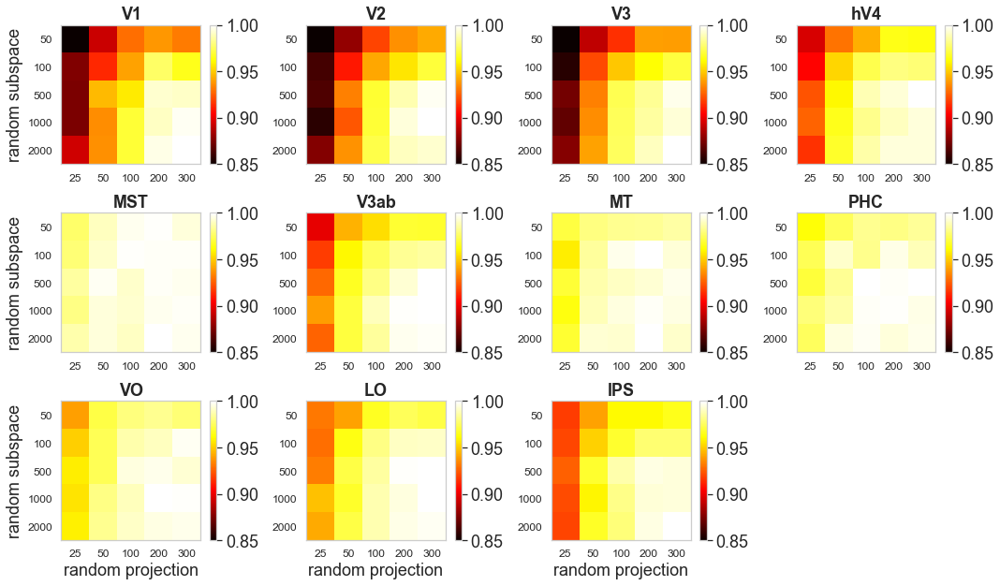

In [108]:
n = len(plot_roi)
nx = 4
ny = int(np.ceil(n/nx))
fig=plt.figure(figsize=(4*nx, 3*ny))
plt.subplots_adjust(left=0.1, bottom=0.1, right=.95, top=.95, wspace=0.35, hspace=0.35) 
for k,r in enumerate(plot_roi):
    plt.subplot(ny, nx, k+1)   

    M = sum([SNR_average[s][r] for s in subjects]) / len(subjects)
    M_max = np.max(M)
    plt.imshow(M / M_max, cmap='hot', vmin=.85, vmax=1.)
    if k%nx==0:
        plt.ylabel('random subspace')
    if k>=(n//nx)*nx:
        plt.xlabel('random projection')
    plt.gca().set_xticks(np.arange(len(projection_dims)))
    plt.gca().set_xticklabels(projection_dims, fontsize=12)
    plt.gca().set_yticks(np.arange(len(subspace_dims)))
    plt.gca().set_yticklabels(subspace_dims, fontsize=12)
    plt.colorbar()    
    plt.grid(False)
    plt.title(r, {'fontsize': 18, 'fontweight' : 'bold'})

In [107]:
filename = output_dir + "nsdpred_manifold_geometry_convergence_S_rc%s" % (saveext)
fig.savefig(filename, **savearg)
plt.close()

In [100]:
print (output_dir)

../nsd_gnet8x/output/multisubject/gnet8j64t192_mpf_general_Jan-25-2023_1316/


# Multi-fold error and SNR for NSDpred
I need to make sure I have enough of each categories in each fold

In [ ]:
m = 5
n_folds   = 16
n_samples = 16

from src.geometry import feature_subsampling_and_split, calculate_manifolds_error, calculate_manifolds_directions, calculate_manifolds_SNR


manifold_errs, manifold_SNRs = None, None
for f in range(n_folds):
    (err_feature_embs, err_labels, min_err_samples), (geom_feature_embs, geom_labels, min_geom_samples) = \
        feature_subsampling_and_split(feature_dicts, things_mh, random_subspace=1000, random_projections=300, err_frac=.1)
    print (min_err_samples, min_geom_samples)

    manifold_err = calculate_manifolds_error(err_feature_embs, labels=err_labels, m=m, n_samples=n_samples)  
    manifold_SNR = calculate_manifolds_SNR(calculate_manifolds_directions(geom_feature_embs, labels=geom_labels, P=(min_geom_samples//100)*100), m=m)
    
    # aggregate estimates from all folds
    if manifold_errs is None:
        manifold_errs = {}
        for s,dd in manifold_err.items():   
            manifold_errs[s] = {'m': manifold_err[s]['m'], 'n_samples': manifold_err[s]['n_samples']}
            for f in ['err', 'std']:
                manifold_errs[s][f] = {}
                for r,d in dd[f].items():
                    manifold_errs[s][f][r] = [d,]
    else:
        for s,dd in manifold_err.items():   
            for f in ['err', 'std']:
                for r,d in dd[f].items():
                    manifold_errs[s][f][r] += [d,]
    if manifold_SNRs is None:
        manifold_SNRs = {}
        for s,dd in manifold_SNR.items():
            manifold_SNRs[s] = {'m': manifold_SNR[s]['m'], 'P': manifold_SNR[s]['P']}
            for f in ['Sign', 'Bias', 'Nsa', 'Nsb', 'Nss', 'Ds', 'SNR']:
                manifold_SNRs[s][f] = {}
                for r,d in dd[f].items():
                    manifold_SNRs[s][f][r] = [d,]       
    else:
        for s,dd in manifold_SNR.items():
            for f in ['Sign', 'Bias', 'Nsa', 'Nsb', 'Nss', 'Ds', 'SNR']:
                for r,d in dd[f].items():
                    manifold_SNRs[s][f][r] += [d,]
### convert list into array                    
for s,dd in manifold_errs.items():   
    for f in ['err', 'std']:
        for r,d in dd[f].items():
            manifold_errs[s][f][r] = np.array(d)
for s,dd in manifold_SNRs.items():
    for f in ['Sign', 'Bias', 'Nsa', 'Nsb', 'Nss', 'Ds', 'SNR']:
        for r,d in dd[f].items():
            manifold_SNRs[s][f][r] = np.array(d)

58 591


100%|██████████| 12/12 [00:00<00:00, 84.17it/s]


57 597


100%|██████████| 12/12 [00:00<00:00, 49.94it/s]


61 588


100%|██████████| 12/12 [00:00<00:00, 84.00it/s]


53 582


100%|██████████| 12/12 [00:00<00:00, 83.79it/s]


61 581


100%|██████████| 12/12 [00:00<00:00, 83.39it/s]


52 586


100%|██████████| 12/12 [00:00<00:00, 84.17it/s]


55 585


100%|██████████| 12/12 [00:00<00:00, 76.10it/s]


66 581


 27%|██▋       | 3/11 [00:00<00:00,  8.13it/s]

In [ ]:
save_stuff( output_dir + 'nsdpred_zmanifold_%dshot_err_all_rc'%(m), 
    flatten_dict(manifold_errs))

save_stuff( output_dir + 'nsdpred_zmanifold_geom_SNR_all_rc', 
    flatten_dict(manifold_SNRs))

In [154]:
print ( manifold_SNRs[1]['SNR']['V1'].shape)

(16, 12, 12)


---
# Figures

Can I aggregate multiple subjects?

## Test of the theory for all single fold for individual concept

Main category = person


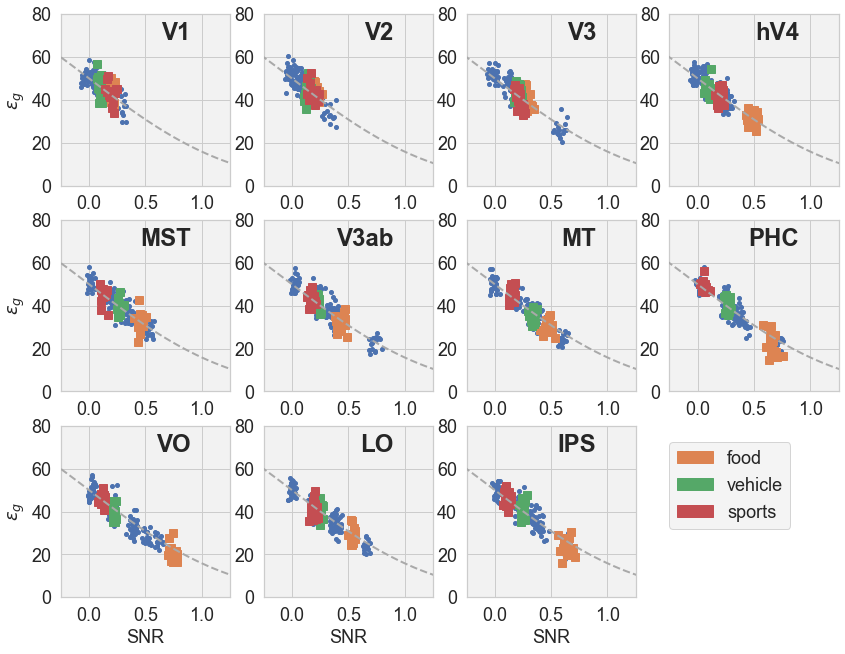

In [187]:
main_cat = 10
other_cat = [9, 6, 8]
cat_colors = {c: sns.color_palette()[k] for k,c in enumerate([main_cat,]+other_cat)}
print ('Main category = %s'%thing_labelmap[main_cat])

from src.geometry import H

subj = 1
n = len(plot_roi)
nx = 4
ny = int(np.ceil(n/nx))
fig=plt.figure(figsize=(3*nx, 3*ny))
plt.subplots_adjust(left=0.05, bottom=0.05, right=.95, top=.95, wspace=0.2, hspace=0.2) 
for k,r in enumerate(plot_roi):
    plt.subplot(ny, nx, k+1)   
    
    SNR = manifold_SNRs[subj]['SNR'][r][:, main_cat].flatten()
    err = manifold_errs[subj]['err'][r][:, main_cat].flatten() * 100
    plt.plot(SNR, err, marker='.', ms=8, linestyle='None', color=cat_colors[main_cat])
        
    for c in other_cat:
        x = manifold_SNRs[subj]['SNR'][r][:, main_cat, c]
        y = manifold_errs[subj]['err'][r][:, main_cat, c] * 100
        plt.plot(x, y, marker='s', color=cat_colors[c], ms=8, linestyle='None')
        #plt.text(x+0.1, y+0.05, thing_labelmap[c], fontsize=12)
    # Plot theory
    x = np.linspace(-1,np.nanmax(SNR)+1,50)
    plt.plot(x, H(x), c='darkgray', linestyle='dashed', linewidth=2, label='theory', zorder=99)
    plt.xlim([-.25, 1.25])
    plt.ylim([0, 80])
    if k>=8:
        plt.xlabel('SNR', fontsize=18)
    if k%nx==0:
        plt.ylabel(r'$\epsilon_g$', fontsize=18)
    plt.text(.9, 68, r, {'fontsize': 24, 'fontweight' : 'bold'}, horizontalalignment='right')
    
plt.gca().legend([Patch(color=cat_colors[c]) for c in other_cat], [thing_labelmap[c] for c in other_cat], loc=(1.2, 0.4))

In [188]:
filename = output_dir + "nsdpred_manifold_5shot_error_vs_SNR_%s_rc%s" % (thing_labelmap[main_cat], saveext)
fig.savefig(filename, **savearg)
plt.close()

Main category = person


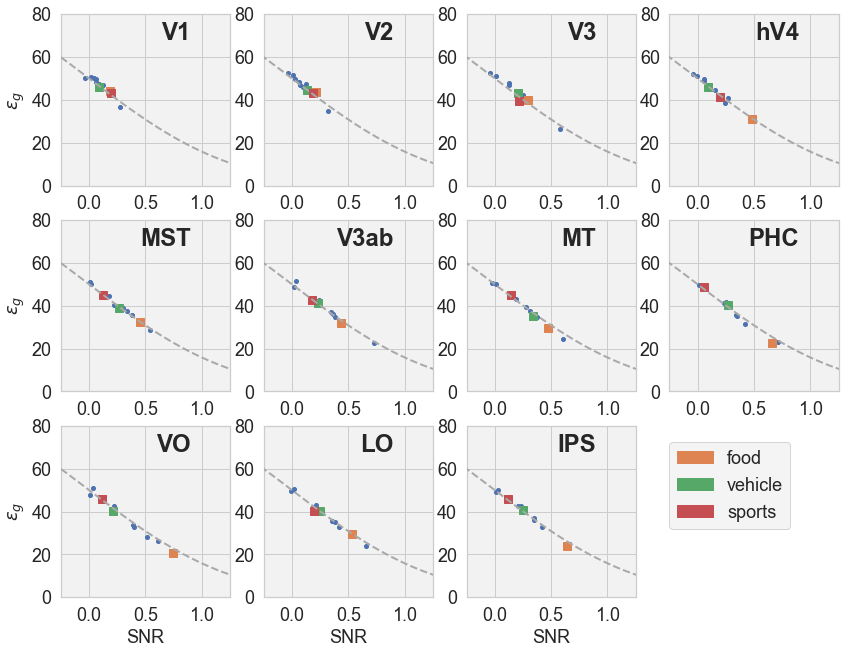

In [189]:
main_cat = 10
other_cat = [9, 6, 8]
cat_colors = {c: sns.color_palette()[k] for k,c in enumerate([main_cat,]+other_cat)}
print ('Main category = %s'%thing_labelmap[main_cat])

from src.geometry import H

subj = 1
n = len(plot_roi)
nx = 4
ny = int(np.ceil(n/nx))
fig=plt.figure(figsize=(3*nx, 3*ny))
plt.subplots_adjust(left=0.05, bottom=0.05, right=.95, top=.95, wspace=0.2, hspace=0.2) 
for k,r in enumerate(plot_roi):
    plt.subplot(ny, nx, k+1)   
    
    SNR = np.mean(manifold_SNRs[subj]['SNR'][r], axis=0)[main_cat] # average over samples
    err = np.mean(manifold_errs[subj]['err'][r], axis=0)[main_cat] * 100
    plt.plot(SNR, err, marker='.', ms=8, linestyle='None', color=cat_colors[main_cat])
        
    for c in other_cat:
        x = np.mean(manifold_SNRs[subj]['SNR'][r], axis=0)[main_cat, c]
        y = np.mean(manifold_errs[subj]['err'][r], axis=0)[main_cat, c] * 100
        plt.plot(x, y, marker='s', color=cat_colors[c], ms=8, linestyle='None')
        #plt.text(x+0.1, y+0.05, thing_labelmap[c], fontsize=12)
    # Plot theory
    x = np.linspace(-1,np.nanmax(SNR)+1,50)
    plt.plot(x, H(x), c='darkgray', linestyle='dashed', linewidth=2, label='theory', zorder=99)
    plt.xlim([-.25, 1.25])
    plt.ylim([0, 80])
    if k>=8:
        plt.xlabel('SNR', fontsize=18)
    if k%nx==0:
        plt.ylabel(r'$\epsilon_g$', fontsize=18)
    plt.text(.9, 68, r, {'fontsize': 24, 'fontweight' : 'bold'}, horizontalalignment='right')
    
plt.gca().legend([Patch(color=cat_colors[c]) for c in other_cat], [thing_labelmap[c] for c in other_cat], loc=(1.2, 0.4))

In [190]:
filename = output_dir + "nsdpred_manifold_5shot_error_vs_SNR_avg_%s_rc%s" % (thing_labelmap[main_cat], saveext)
fig.savefig(filename, **savearg)
plt.close()

## Test of the theory for all folds for all concepts indistinguished

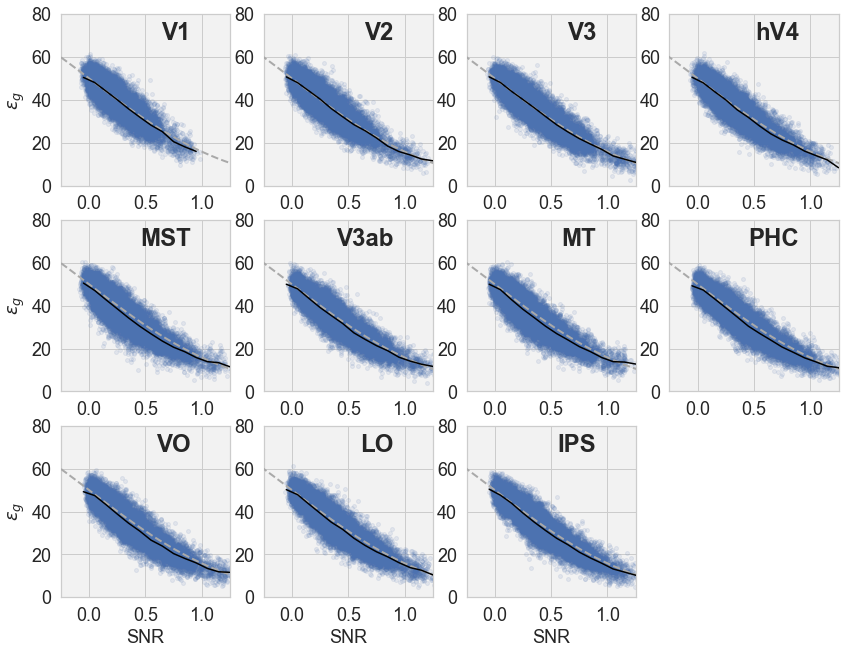

In [193]:
from src.geometry import H
from scipy.stats import binned_statistic

n = len(plot_roi)
nx = 4
ny = int(np.ceil(n/nx))
fig=plt.figure(figsize=(3*nx, 3*ny))
plt.subplots_adjust(left=0.05, bottom=0.05, right=.95, top=.95, wspace=0.2, hspace=0.2) 
for k,r in enumerate(plot_roi):
    plt.subplot(ny, nx, k+1)   
    
    SNR, err = [], []
    for s in subjects:
        nanmask = np.isnan(manifold_SNRs[s]['SNR'][r].flatten())
        SNR += [manifold_SNRs[s]['SNR'][r].flatten()[~nanmask],]
        err += [manifold_errs[s]['err'][r].flatten()[~nanmask] * 100,]
    SNR = np.array(SNR).flatten()
    err = np.array(err).flatten()
    plt.plot(SNR, err, marker='.', ms=8, linestyle='None', color=cat_colors[main_cat], alpha=.1)
    bin_means, bin_edges, binnumber = binned_statistic(SNR, err, statistic='mean', bins=16, range=[-.1, 1.5])
    plt.plot((bin_edges[1:]+bin_edges[:-1])/2, bin_means, marker=None, linestyle='-', ms=4, color='k', zorder=100)
    # Plot theory
    x = np.linspace(-1,np.nanmax(SNR)+1,50)
    plt.plot(x, H(x), c='darkgray', linestyle='dashed', linewidth=2, label='theory', zorder=99)
    plt.xlim([-.25, 1.25])
    plt.ylim([0, 80])
    if k>=8:
        plt.xlabel('SNR', fontsize=18)
    if k%nx==0:
        plt.ylabel(r'$\epsilon_g$', fontsize=18)
    plt.text(.9, 68, r, {'fontsize': 24, 'fontweight' : 'bold'}, horizontalalignment='right')

In [194]:
filename = output_dir + "nsdpred_manifold_5shot_error_vs_SNR_all_subjects_all_pairs_all_folds_rc%s" % (saveext)
fig.savefig(filename, **savearg)
plt.close()

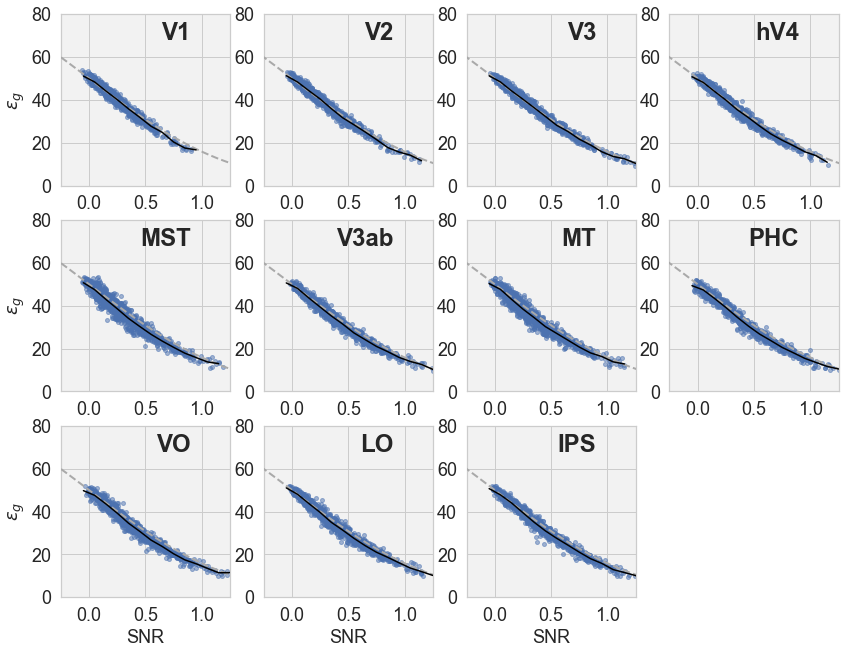

In [201]:
from src.geometry import H
from scipy.stats import binned_statistic

subj = 1
n = len(plot_roi)
nx = 4
ny = int(np.ceil(n/nx))
fig=plt.figure(figsize=(3*nx, 3*ny))
plt.subplots_adjust(left=0.05, bottom=0.05, right=.95, top=.95, wspace=0.2, hspace=0.2) 
for k,r in enumerate(plot_roi):
    plt.subplot(ny, nx, k+1)   
    
    SNR, err = [], []
    for s in subjects:
        SNR += [offdiagonal(np.mean(manifold_SNRs[s]['SNR'][r], axis=0)),] # average over samples
        err += [offdiagonal(np.mean(manifold_errs[s]['err'][r], axis=0)) * 100,]
    SNR = np.array(SNR).flatten()
    err = np.array(err).flatten() 
    plt.plot(SNR, err, marker='.', ms=8, linestyle='None', color=cat_colors[main_cat], alpha=.5)
    bin_means, bin_edges, binnumber = binned_statistic(SNR, err, statistic='mean', bins=16, range=[-.1, 1.5])
    plt.plot((bin_edges[1:]+bin_edges[:-1])/2, bin_means, marker=None, linestyle='-', ms=4, color='k', zorder=100)
    
    # Plot theory
    x = np.linspace(-1,np.nanmax(SNR)+1,50)
    plt.plot(x, H(x), c='darkgray', linestyle='dashed', linewidth=2, label='theory', zorder=99)
    plt.xlim([-.25, 1.25])
    plt.ylim([0, 80])
    if k>=8:
        plt.xlabel('SNR', fontsize=18)
    if k%nx==0:
        plt.ylabel(r'$\epsilon_g$', fontsize=18)
    plt.text(.9, 68, r, {'fontsize': 24, 'fontweight' : 'bold'}, horizontalalignment='right')

In [202]:
filename = output_dir + "nsdpred_manifold_5shot_error_vs_SNR_all_subjects_all_pairs_rc%s" % (saveext)
fig.savefig(filename, **savearg)
plt.close()

## Sort ROI by average SNR

['V1', 'V2', 'MST', 'MT', 'hV4', 'V3', 'PHC', 'VO', 'V3ab', 'LO', 'IPS']


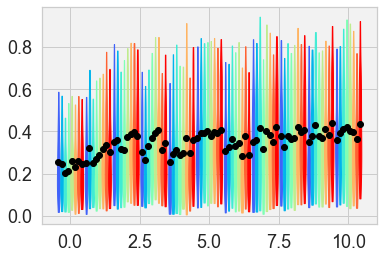

In [221]:
sa, gYmin, gYmax = braingeom_sample_average(manifold_SNRs, 'SNR', subj_cmap, plot_roi, percentile_cutoff=5) 
#sa, gYmin, gYmax = brain5shot_sample_average(nsdpred_5shot_dict, subjects, plot_roi, percentile_cutoff=5) 
plot_roi_re = [plot_roi[i] for i in np.argsort(np.mean(sa, axis=0))]
print (plot_roi_re)

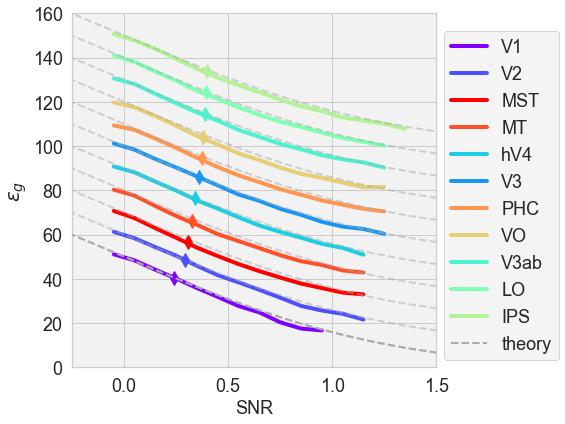

In [226]:
from src.geometry import H
from scipy.stats import binned_statistic

fig=plt.figure(figsize=(8, 6))
plt.subplots_adjust(left=0.05, bottom=0.05, right=.95, top=.95, wspace=0.0, hspace=0.0) 

x = np.linspace(-1, 3., 100)  
for k,r in enumerate(plot_roi_re):
    err, SNR = [], []
    for s in subjects:
        SNR += [offdiagonal(np.mean(manifold_SNRs[s]['SNR'][r], axis=0)),]
        err += [offdiagonal(np.mean(manifold_errs[s]['err'][r], axis=0)) * 100,]    
    err = np.concatenate(err)   
    SNR = np.concatenate(SNR) 
 
    bin_means, bin_edges, binnumber = binned_statistic(SNR, err + k*10, statistic='mean', bins=16, range=[-.1, 1.5])
    plt.plot((bin_edges[1:]+bin_edges[:-1])/2, bin_means, marker=None, linestyle='-', lw=4, color=roi_cmap[r], label=r)
    plt.plot(x, H(x)+k*10, c='darkgray', linestyle='dashed', linewidth=2, alpha=.5) 
    plt.plot(np.mean(SNR), np.mean(err+k*10), color=roi_cmap[r], marker='d', ms=10)
# Plot theory
plt.plot(x, H(x), c='darkgray', linestyle='dashed', linewidth=2, label='theory', zorder=99)  
plt.xlim([-.25, 1.5])
plt.ylim([0, 160])
plt.xlabel('SNR', fontsize=18)
plt.ylabel(r'$\epsilon_g$', fontsize=20)
plt.legend(loc=(1.02, 0.02))
plt.tight_layout()

In [223]:
filename = output_dir + "nsdpred_manifold_5shot_error_vs_SNR_binned_average_rc%s" % (saveext)
fig.savefig(filename, **savearg)
plt.close()